# Performance on Unconverted Photons


In [1]:
import sys
sys.path.insert(0, '..')
import ROOT
import root_numpy as rnp
import l1THistos as histos
import math
import uuid

ROOT.enableJSVis()

from drawingTools import *

normalized_histos = list()
    

Welcome to JupyROOT 6.10/08


In [2]:
version = 'v14'
sample_gPt35_PU0 = Sample('photonPt35', 'PU0', version)
sample_gPt35_PU200 = Sample('photonPt35', 'PU200', version)
sample_gPt50_PU0 = Sample('photonPt50', 'PU0', version)
sample_gPt50_PU200 = Sample('photonPt50', 'PU200', version)

samples_pt35 = [sample_gPt35_PU0, sample_gPt35_PU200]
labels_pt35 = ['pt35 PU0', 'pt35 PU200']

samples_pt50 = [sample_gPt50_PU0, sample_gPt50_PU200]
labels_pt50 = ['pt50 PU0', 'pt50 PU200']


# Gen level

In [3]:
# for normalization
hGen_pt35_histos = [histos.GenParticleHistos('h_genPartsGammas', sample.histo_file) for sample in samples_pt35]
hGen_pt50_histos = [histos.GenParticleHistos('h_genPartsGammas', sample.histo_file) for sample in samples_pt50]

['h_genPartsGammas_energy', 'h_genPartsGammas_eta', 'h_genPartsGammas_pt', 'h_genPartsGammas_reachedEE']
['h_genPartsGammas_energy', 'h_genPartsGammas_eta', 'h_genPartsGammas_pt', 'h_genPartsGammas_reachedEE']
['h_genPartsGammas_energy', 'h_genPartsGammas_eta', 'h_genPartsGammas_pt', 'h_genPartsGammas_reachedEE']
['h_genPartsGammas_energy', 'h_genPartsGammas_eta', 'h_genPartsGammas_pt', 'h_genPartsGammas_reachedEE']


In [4]:

hGen_pt35_energy = [histo.h_energy for histo in hGen_pt35_histos]
drawSame(hGen_pt35_energy, labels_pt35,'hist',logy=True)


hGen_pt50_energy = [histo.h_energy for histo in hGen_pt50_histos]
drawSame(hGen_pt50_energy, labels_pt50,'hist',logy=True)




In [5]:
hGen_pt35_eta = [histo.h_eta for histo in hGen_pt35_histos]
drawSame(hGen_pt35_eta, labels_pt35,'hist',logy=True)

hGen_pt50_eta = [histo.h_eta for histo in hGen_pt50_histos]
drawSame(hGen_pt50_eta, labels_pt50,'hist',logy=True)


In [6]:
hGen_pt35_pt = [histo.h_pt for histo in hGen_pt35_histos]
drawSame(hGen_pt35_pt, labels_pt35,'hist',logy=True)


## Il plot preferito di CS
bla bla bla

In [7]:
hGen_pt35_reachedEE = [histo.h_reachedEE for histo in hGen_pt35_histos]
drawSame(hGen_pt35_reachedEE, labels_pt35,'hist',logy=True)

hGen_pt50_reachedEE = [histo.h_reachedEE for histo in hGen_pt50_histos]
drawSame(hGen_pt50_reachedEE, labels_pt50,'hist',logy=True)



In [8]:
# Extract # of events for normalization
nevents_pt35 = [histo.GetEntries()/2 for histo in hGen_pt35_reachedEE]
print nevents_pt35

nevents_pt50 = [histo.GetEntries()/2 for histo in hGen_pt50_reachedEE]
print nevents_pt50

[3000.0, 3200.0]
[3000.0, 3800.0]


In [9]:
def normalize(histos, factors):
    global normalized_histos
    for idx in range(0, len(histos)):
        print histos[idx]
        if histos[idx] not in normalized_histos:
            histos[idx].Scale(1./factors[idx])
            normalized_histos.append(histos[idx])

In [10]:
def getHistogramSets(hnames, samples):
    histo_sets = list()
    for hname in hnames:
        histo_sets.append([histos.BaseHistos(hname, sample.histo_file) for sample in samples])
    return histo_sets

# NN plots
hnames = ['h_cl3dAll', 'h_clAll', 'h_cl3dMatch', 'h_clMatch', 'h_tcMatch', 'h_EleReso']
histos_nn_pt35 = getHistogramSets(hnames, samples_pt35)

hcl3DAll_pt35_histos   = histos_nn_pt35[0]
hclAll_pt35_histos     = histos_nn_pt35[1]
hcl3DMatch_pt35_histos = histos_nn_pt35[2]
hclMatch_pt35_histos   = histos_nn_pt35[3]
htcMatch_pt35_histos   = histos_nn_pt35[4]
helereso_pt35_histos   = histos_nn_pt35[5]

#hreso2D_histos = [histos.Reso2DHistos('h_ClReso', sample.histo_file) for sample in samples_pt35]

#heleresoDBS_test = histos.ResoHistos('h_EleReso', file_test)


histos_nn_pt50 = getHistogramSets(hnames, samples_pt50)

hcl3DAll_pt50_histos   = histos_nn_pt50[0]
hclAll_pt50_histos     = histos_nn_pt50[1]
hcl3DMatch_pt50_histos = histos_nn_pt50[2]
hclMatch_pt50_histos   = histos_nn_pt50[3]
htcMatch_pt50_histos   = histos_nn_pt50[4]
helereso_pt50_histos   = histos_nn_pt50[5]



['h_cl3dAll_eMaxOverE', 'h_cl3dAll_energy', 'h_cl3dAll_firstlayer', 'h_cl3dAll_nclu', 'h_cl3dAll_ncluVpt', 'h_cl3dAll_pt', 'h_cl3dAll_sEtaEtaMax', 'h_cl3dAll_sEtaEtaTot', 'h_cl3dAll_sPhiPhiMax', 'h_cl3dAll_sPhiPhiTot', 'h_cl3dAll_sZZ', 'h_cl3dAll_showlenght']
['h_cl3dAll_eMaxOverE', 'h_cl3dAll_energy', 'h_cl3dAll_firstlayer', 'h_cl3dAll_nclu', 'h_cl3dAll_ncluVpt', 'h_cl3dAll_pt', 'h_cl3dAll_sEtaEtaMax', 'h_cl3dAll_sEtaEtaTot', 'h_cl3dAll_sPhiPhiMax', 'h_cl3dAll_sPhiPhiTot', 'h_cl3dAll_sZZ', 'h_cl3dAll_showlenght']
['h_clAll_energy', 'h_clAll_layer', 'h_clAll_layerVenergy', 'h_clAll_layerVnCoreCells', 'h_clAll_layerVncells', 'h_clAll_nCoreCells', 'h_clAll_ncells']
['h_clAll_energy', 'h_clAll_layer', 'h_clAll_layerVenergy', 'h_clAll_layerVnCoreCells', 'h_clAll_layerVncells', 'h_clAll_nCoreCells', 'h_clAll_ncells']
['h_cl3dMatch_eMaxOverE', 'h_cl3dMatch_energy', 'h_cl3dMatch_firstlayer', 'h_cl3dMatch_nclu', 'h_cl3dMatch_ncluVpt', 'h_cl3dMatch_pt', 'h_cl3dMatch_sEtaEtaMax', 'h_cl3dMatch_sE

In [11]:

# GEO plots
hnames = ['h_cl3dGEOAll', 'h_clGEOAll', 'h_cl3dMatchGEO', 'h_clMatchGEO', 'h_tcMatchGEO', 'h_EleResoGEO']
histos_GEO_pt35 = getHistogramSets(hnames, samples_pt35)

hcl3DAllGEO_pt35_histos   = histos_GEO_pt35[0]
hclAllGEO_pt35_histos     = histos_GEO_pt35[1]
hcl3DMatchGEO_pt35_histos = histos_GEO_pt35[2]
hclMatchGEO_pt35_histos   = histos_GEO_pt35[3]
htcMatchGEO_pt35_histos   = histos_GEO_pt35[4]
heleresoGEO_pt35_histos   = histos_GEO_pt35[5]


histos_GEO_pt50 = getHistogramSets(hnames, samples_pt50)

hcl3DAllGEO_pt50_histos   = histos_GEO_pt50[0]
hclAllGEO_pt50_histos     = histos_GEO_pt50[1]
hcl3DMatchGEO_pt50_histos = histos_GEO_pt50[2]
hclMatchGEO_pt50_histos   = histos_GEO_pt50[3]
htcMatchGEO_pt50_histos   = histos_GEO_pt50[4]
heleresoGEO_pt50_histos   = histos_GEO_pt50[5]



['h_cl3dGEOAll_eMaxOverE', 'h_cl3dGEOAll_energy', 'h_cl3dGEOAll_firstlayer', 'h_cl3dGEOAll_nclu', 'h_cl3dGEOAll_ncluVpt', 'h_cl3dGEOAll_pt', 'h_cl3dGEOAll_sEtaEtaMax', 'h_cl3dGEOAll_sEtaEtaTot', 'h_cl3dGEOAll_sPhiPhiMax', 'h_cl3dGEOAll_sPhiPhiTot', 'h_cl3dGEOAll_sZZ', 'h_cl3dGEOAll_showlenght']
['h_cl3dGEOAll_eMaxOverE', 'h_cl3dGEOAll_energy', 'h_cl3dGEOAll_firstlayer', 'h_cl3dGEOAll_nclu', 'h_cl3dGEOAll_ncluVpt', 'h_cl3dGEOAll_pt', 'h_cl3dGEOAll_sEtaEtaMax', 'h_cl3dGEOAll_sEtaEtaTot', 'h_cl3dGEOAll_sPhiPhiMax', 'h_cl3dGEOAll_sPhiPhiTot', 'h_cl3dGEOAll_sZZ', 'h_cl3dGEOAll_showlenght']
['h_clGEOAll_energy', 'h_clGEOAll_layer', 'h_clGEOAll_layerVenergy', 'h_clGEOAll_layerVnCoreCells', 'h_clGEOAll_layerVncells', 'h_clGEOAll_nCoreCells', 'h_clGEOAll_ncells']
['h_clGEOAll_energy', 'h_clGEOAll_layer', 'h_clGEOAll_layerVenergy', 'h_clGEOAll_layerVnCoreCells', 'h_clGEOAll_layerVncells', 'h_clGEOAll_nCoreCells', 'h_clGEOAll_ncells']
['h_cl3dMatchGEO_eMaxOverE', 'h_cl3dMatchGEO_energy', 'h_cl3dM

In [12]:

# DBS plots
hnames = ['h_cl3dDBSAll', 'h_clDBSAll', 'h_cl3dMatchDBS', 'h_clMatchDBS', 'h_tcMatchDBS', 'h_EleResoDBS']
histos_DBS_pt35 = getHistogramSets(hnames, samples_pt35)

hcl3DAllDBS_pt35_histos   = histos_DBS_pt35[0]
hclAllDBS_pt35_histos     = histos_DBS_pt35[1]
hcl3DMatchDBS_pt35_histos = histos_DBS_pt35[2]
hclMatchDBS_pt35_histos   = histos_DBS_pt35[3]
htcMatchDBS_pt35_histos   = histos_DBS_pt35[4]
heleresoDBS_pt35_histos   = histos_DBS_pt35[5]


histos_DBS_pt50 = getHistogramSets(hnames, samples_pt50)

hcl3DAllDBS_pt50_histos   = histos_DBS_pt50[0]
hclAllDBS_pt50_histos     = histos_DBS_pt50[1]
hcl3DMatchDBS_pt50_histos = histos_DBS_pt50[2]
hclMatchDBS_pt50_histos   = histos_DBS_pt50[3]
htcMatchDBS_pt50_histos   = histos_DBS_pt50[4]
heleresoDBS_pt50_histos   = histos_DBS_pt50[5]


['h_cl3dDBSAll_eMaxOverE', 'h_cl3dDBSAll_energy', 'h_cl3dDBSAll_firstlayer', 'h_cl3dDBSAll_nclu', 'h_cl3dDBSAll_ncluVpt', 'h_cl3dDBSAll_pt', 'h_cl3dDBSAll_sEtaEtaMax', 'h_cl3dDBSAll_sEtaEtaTot', 'h_cl3dDBSAll_sPhiPhiMax', 'h_cl3dDBSAll_sPhiPhiTot', 'h_cl3dDBSAll_sZZ', 'h_cl3dDBSAll_showlenght']
['h_cl3dDBSAll_eMaxOverE', 'h_cl3dDBSAll_energy', 'h_cl3dDBSAll_firstlayer', 'h_cl3dDBSAll_nclu', 'h_cl3dDBSAll_ncluVpt', 'h_cl3dDBSAll_pt', 'h_cl3dDBSAll_sEtaEtaMax', 'h_cl3dDBSAll_sEtaEtaTot', 'h_cl3dDBSAll_sPhiPhiMax', 'h_cl3dDBSAll_sPhiPhiTot', 'h_cl3dDBSAll_sZZ', 'h_cl3dDBSAll_showlenght']
['h_clDBSAll_energy', 'h_clDBSAll_layer', 'h_clDBSAll_layerVenergy', 'h_clDBSAll_layerVnCoreCells', 'h_clDBSAll_layerVncells', 'h_clDBSAll_nCoreCells', 'h_clDBSAll_ncells']
['h_clDBSAll_energy', 'h_clDBSAll_layer', 'h_clDBSAll_layerVenergy', 'h_clDBSAll_layerVnCoreCells', 'h_clDBSAll_layerVncells', 'h_clDBSAll_nCoreCells', 'h_clDBSAll_ncells']
['h_cl3dMatchDBS_eMaxOverE', 'h_cl3dMatchDBS_energy', 'h_cl3dM

In [13]:

# DBSp plots
hnames = ['h_cl3dDBSpAll', 'h_cl3dMatchDBSp', 'h_clMatchDBSp', 'h_tcMatchDBSp', 'h_EleResoDBSp']
histos_DBSp_pt35 = getHistogramSets(hnames, samples_pt35)

hcl3DAllDBSp_pt35_histos   = histos_DBSp_pt35[0]
hcl3DMatchDBSp_pt35_histos = histos_DBSp_pt35[1]
hclMatchDBSp_pt35_histos   = histos_DBSp_pt35[2]
htcMatchDBSp_pt35_histos   = histos_DBSp_pt35[3]
heleresoDBSp_pt35_histos   = histos_DBSp_pt35[4]


histos_DBSp_pt50 = getHistogramSets(hnames, samples_pt50)

hcl3DAllDBSp_pt50_histos   = histos_DBSp_pt50[0]
hcl3DMatchDBSp_pt50_histos = histos_DBSp_pt50[1]
hclMatchDBSp_pt50_histos   = histos_DBSp_pt50[2]
htcMatchDBSp_pt50_histos   = histos_DBSp_pt50[3]
heleresoDBSp_pt50_histos   = histos_DBSp_pt50[4]


['h_cl3dDBSpAll_eMaxOverE', 'h_cl3dDBSpAll_energy', 'h_cl3dDBSpAll_firstlayer', 'h_cl3dDBSpAll_nclu', 'h_cl3dDBSpAll_ncluVpt', 'h_cl3dDBSpAll_pt', 'h_cl3dDBSpAll_sEtaEtaMax', 'h_cl3dDBSpAll_sEtaEtaTot', 'h_cl3dDBSpAll_sPhiPhiMax', 'h_cl3dDBSpAll_sPhiPhiTot', 'h_cl3dDBSpAll_sZZ', 'h_cl3dDBSpAll_showlenght']
['h_cl3dDBSpAll_eMaxOverE', 'h_cl3dDBSpAll_energy', 'h_cl3dDBSpAll_firstlayer', 'h_cl3dDBSpAll_nclu', 'h_cl3dDBSpAll_ncluVpt', 'h_cl3dDBSpAll_pt', 'h_cl3dDBSpAll_sEtaEtaMax', 'h_cl3dDBSpAll_sEtaEtaTot', 'h_cl3dDBSpAll_sPhiPhiMax', 'h_cl3dDBSpAll_sPhiPhiTot', 'h_cl3dDBSpAll_sZZ', 'h_cl3dDBSpAll_showlenght']
['h_cl3dMatchDBSp_eMaxOverE', 'h_cl3dMatchDBSp_energy', 'h_cl3dMatchDBSp_firstlayer', 'h_cl3dMatchDBSp_nclu', 'h_cl3dMatchDBSp_ncluVpt', 'h_cl3dMatchDBSp_pt', 'h_cl3dMatchDBSp_sEtaEtaMax', 'h_cl3dMatchDBSp_sEtaEtaTot', 'h_cl3dMatchDBSp_sPhiPhiMax', 'h_cl3dMatchDBSp_sPhiPhiTot', 'h_cl3dMatchDBSp_sZZ', 'h_cl3dMatchDBSp_showlenght']
['h_cl3dMatchDBSp_eMaxOverE', 'h_cl3dMatchDBSp_energ

## 2D clusters (all)
### # of 2D clusters

In [14]:
hclAll_pt35_layer = [histo.h_layer for histo in hclAll_pt35_histos]
normalize(hclAll_pt35_layer, nevents_pt35)
drawSame(hclAll_pt35_layer, labels_pt35,'hist',logy=True)

hclAll_pt50_layer = [histo.h_layer for histo in hclAll_pt50_histos]
normalize(hclAll_pt50_layer, nevents_pt50)
drawSame(hclAll_pt50_layer, labels_pt50,'hist',logy=True)


<ROOT.TH1F object ("h_clAll_layer") at 0x7fb08b933de0>
<ROOT.TH1F object ("h_clAll_layer") at 0x7fb08afee090>
<ROOT.TH1F object ("h_clAll_layer") at 0x7fb08ba48e00>
<ROOT.TH1F object ("h_clAll_layer") at 0x7fb08b8eac60>


In [15]:
hclAllGEO_pt35_layer = [histo.h_layer for histo in hclAllGEO_pt35_histos]
normalize(hclAllGEO_pt35_layer, nevents_pt35)
drawSame(hclAllGEO_pt35_layer, labels_pt35,'hist',logy=True)

hclAllGEO_pt50_layer = [histo.h_layer for histo in hclAllGEO_pt50_histos]
normalize(hclAllGEO_pt50_layer, nevents_pt50)
drawSame(hclAllGEO_pt50_layer, labels_pt50,'hist',logy=True)

<ROOT.TH1F object ("h_clGEOAll_layer") at 0x7fb08ae843e0>
<ROOT.TH1F object ("h_clGEOAll_layer") at 0x7fb08ae853e0>
<ROOT.TH1F object ("h_clGEOAll_layer") at 0x7fb08bb21740>
<ROOT.TH1F object ("h_clGEOAll_layer") at 0x7fb08ba61e40>


In [16]:
hclAllDBS_pt35_layer = [histo.h_layer for histo in hclAllDBS_pt35_histos]
normalize(hclAllDBS_pt35_layer, nevents_pt35)
drawSame(hclAllDBS_pt35_layer, labels_pt35,'hist',logy=True)

hclAllDBS_pt50_layer = [histo.h_layer for histo in hclAllDBS_pt50_histos]
normalize(hclAllDBS_pt50_layer, nevents_pt50)
drawSame(hclAllDBS_pt50_layer, labels_pt50,'hist',logy=True)


<ROOT.TH1F object ("h_clDBSAll_layer") at 0x7fb08aeba880>
<ROOT.TH1F object ("h_clDBSAll_layer") at 0x7fb08aebc5b0>
<ROOT.TH1F object ("h_clDBSAll_layer") at 0x7fb08ba7ea80>
<ROOT.TH1F object ("h_clDBSAll_layer") at 0x7fb08ba80e00>


In [17]:
drawSame([hclAll_pt35_layer[0], hclAllGEO_pt35_layer[0], hclAllDBS_pt35_layer[0]], ['PU0 NN', 'PU0 GEO', 'PU0 DBSCAN'],'hist',logy=True)

drawSame([hclAll_pt50_layer[0], hclAllGEO_pt50_layer[0], hclAllDBS_pt50_layer[0]], ['PU0 NN', 'PU0 GEO', 'PU0 DBSCAN'],'hist',logy=True)

In [18]:
drawSame([hclAll_pt35_layer[1], hclAllGEO_pt35_layer[1], hclAllDBS_pt35_layer[1]], ['PU200 NN', 'PU200 GEO', 'PU200 DBSCAN'],'hist',logy=True)

drawSame([hclAll_pt50_layer[1], hclAllGEO_pt50_layer[1], hclAllDBS_pt50_layer[1]], ['PU200 NN', 'PU200 GEO', 'PU200 DBSCAN'],'hist',logy=True)

### 2D cluster energy

In [19]:
hclAll_pt35_energy = [histo.h_energy for histo in hclAll_pt35_histos]
drawSame(hclAll_pt35_energy, labels_pt35,'hist',logy=True)

hclAll_pt50_energy = [histo.h_energy for histo in hclAll_pt50_histos]
drawSame(hclAll_pt50_energy, labels_pt50,'hist',logy=True)

In [20]:
hclAllGEO_pt35_energy = [histo.h_energy for histo in hclAllGEO_pt35_histos]
drawSame(hclAllGEO_pt35_energy, labels_pt35,'hist',logy=True)

hclAllGEO_pt50_energy = [histo.h_energy for histo in hclAllGEO_pt50_histos]
drawSame(hclAllGEO_pt50_energy, labels_pt50,'hist',logy=True)

In [21]:
hclAllDBS_pt35_energy = [histo.h_energy for histo in hclAllDBS_pt35_histos]
drawSame(hclAllDBS_pt35_energy, labels_pt35,'hist',logy=True)

hclAllDBS_pt50_energy = [histo.h_energy for histo in hclAllDBS_pt50_histos]
drawSame(hclAllDBS_pt50_energy, labels_pt50,'hist',logy=True)

In [22]:
drawSame([hclAll_pt35_energy[0], hclAllGEO_pt35_energy[0], hclAllDBS_pt35_energy[0]], ['PU0 NN', 'PU0 GEO', 'PU0 DBSCAN'],'hist',logy=True)

drawSame([hclAll_pt50_energy[0], hclAllGEO_pt50_energy[0], hclAllDBS_pt50_energy[0]], ['PU0 NN', 'PU0 GEO', 'PU0 DBSCAN'],'hist',logy=True)

In [23]:
drawSame([hclAll_pt35_energy[1], hclAllGEO_pt35_energy[1], hclAllDBS_pt35_energy[1]], ['PU200 NN', 'PU200 GEO', 'PU200 DBSCAN'],'hist',logy=True)

drawSame([hclAll_pt50_energy[1], hclAllGEO_pt50_energy[1], hclAllDBS_pt50_energy[1]], ['PU200 NN', 'PU200 GEO', 'PU200 DBSCAN'],'hist',logy=True)

In [24]:
hclAll_pt35_ncells = [histo.h_ncells for histo in hclAll_pt35_histos]
drawSame(hclAll_pt35_ncells, labels_pt35,'hist',logy=True)

hclAll_pt50_ncells = [histo.h_ncells for histo in hclAll_pt50_histos]
drawSame(hclAll_pt50_ncells, labels_pt50,'hist',logy=True)

In [25]:

hclAllGEO_pt35_ncells = [histo.h_ncells for histo in hclAllGEO_pt35_histos]
drawSame(hclAllGEO_pt35_ncells, labels_pt35,'hist',logy=True)

hclAllGEO_pt50_ncells = [histo.h_ncells for histo in hclAllGEO_pt50_histos]
drawSame(hclAllGEO_pt50_ncells, labels_pt50,'hist',logy=True)

In [26]:

hclAllDBS_pt35_ncells = [histo.h_ncells for histo in hclAllDBS_pt35_histos]
drawSame(hclAllDBS_pt35_ncells, labels_pt35,'hist',logy=True)

hclAllDBS_pt50_ncells = [histo.h_ncells for histo in hclAllDBS_pt50_histos]
drawSame(hclAllDBS_pt50_ncells, labels_pt50,'hist',logy=True)

In [27]:
hclAllDBS_pt35_nCoreCells = [histo.h_nCoreCells for histo in hclAllDBS_pt35_histos]
drawSame(hclAllDBS_pt35_nCoreCells, labels_pt35,'hist',logy=True)

hclAllDBS_pt50_nCoreCells = [histo.h_nCoreCells for histo in hclAllDBS_pt50_histos]
drawSame(hclAllDBS_pt50_nCoreCells, labels_pt50,'hist',logy=True)

In [28]:
drawSame([hclAll_pt35_ncells[0], hclAllGEO_pt35_ncells[0], hclAllDBS_pt35_ncells[0], hclAllDBS_pt35_nCoreCells[0]], ['PU0 NN', 'PU0 GEO', 'PU0 DBSCAN', 'PU0 DBSCAN (core)'],'hist',logy=True)
drawSame([hclAll_pt50_ncells[0], hclAllGEO_pt50_ncells[0], hclAllDBS_pt50_ncells[0], hclAllDBS_pt50_nCoreCells[0]], ['PU0 NN', 'PU0 GEO', 'PU0 DBSCAN', 'PU0 DBSCAN (core)'],'hist',logy=True)


In [29]:
drawSame([hclAll_pt35_ncells[1], hclAllGEO_pt35_ncells[1], hclAllDBS_pt35_ncells[1], hclAllDBS_pt35_nCoreCells[1]], ['PU0 NN', 'PU0 GEO', 'PU0 DBSCAN', 'PU0 DBSCAN (core)'],'hist',logy=True)
drawSame([hclAll_pt50_ncells[1], hclAllGEO_pt50_ncells[1], hclAllDBS_pt50_ncells[1], hclAllDBS_pt50_nCoreCells[1]], ['PU0 NN', 'PU0 GEO', 'PU0 DBSCAN', 'PU0 DBSCAN (core)'],'hist',logy=True)


## # of 3D clusters

In [30]:
#of 3D clusters:
hcl3DAll_pt35_pt = [histo.h_pt for histo in hcl3DAll_pt35_histos]
hcl3DAll_pt50_pt = [histo.h_pt for histo in hcl3DAll_pt50_histos]

hcl3DAllDBS_pt = [histo.h_pt for histo in hcl3DAllDBS_histos]

print 'PU0, #3D NN clusters: {}, #3D DBS clusters {}'.format(hcl3DAll_pt[0].Integral(), hcl3DAllDBS_pt[0].Integral())
# print 'PU50, #3D NN clusters: {}, #3D DBS clusters {}'.format(hcl3DAll_pt[1].Integral(), hcl3DAllDBS_pt[1].Integral())
# print 'PU100, #3D NN clusters: {}, #3D DBS clusters {}'.format(hcl3DAll_pt[2].Integral(), hcl3DAllDBS_pt[2].Integral())
# print 'PU200, #3D NN clusters: {}, #3D DBS clusters {}'.format(hcl3DAll_pt[3].Integral(), hcl3DAllDBS_pt[3].Integral())




NameError: name 'hcl3DAllDBS_histos' is not defined

In [31]:
hcl3DAll_pt35_pt_norm = [histo.h_pt.Clone() for histo in hcl3DAll_pt35_histos]
#normalize(hcl3DAll_pt35_pt_norm, nevents_pt35)
drawSame(hcl3DAll_pt35_pt_norm, labels_pt35, logy=True, norm=True)

hcl3DAll_pt50_pt_norm = [histo.h_pt.Clone() for histo in hcl3DAll_pt50_histos]
#normalize(hcl3DAll_pt50_pt_norm, nevents_pt50)

drawSame(hcl3DAll_pt50_pt_norm, labels_pt35, logy=True, norm=True)

In [32]:
hcl3DAllGEO_pt35_pt_norm = [histo.h_pt.Clone() for histo in hcl3DAllGEO_pt35_histos]
normalize(hcl3DAllGEO_pt35_pt_norm, nevents_pt35)
drawSame(hcl3DAllGEO_pt35_pt_norm, labels_pt35, logy=True)

hcl3DAllGEO_pt50_pt_norm = [histo.h_pt.Clone() for histo in hcl3DAllGEO_pt50_histos]
normalize(hcl3DAllGEO_pt50_pt_norm, nevents_pt50)
drawSame(hcl3DAllGEO_pt50_pt_norm, labels_pt35, logy=True)

<ROOT.TH1F object ("h_cl3dGEOAll_pt") at 0x7fb08aeee150>
<ROOT.TH1F object ("h_cl3dGEOAll_pt") at 0x7fb08aeee870>
<ROOT.TH1F object ("h_cl3dGEOAll_pt") at 0x7fb08bb6d3e0>
<ROOT.TH1F object ("h_cl3dGEOAll_pt") at 0x7fb08bb7bd10>


In [33]:
hcl3DAllDBS_pt35_pt_norm = [histo.h_pt.Clone() for histo in hcl3DAllDBS_pt35_histos]
normalize(hcl3DAllDBS_pt35_pt_norm, nevents_pt35)
drawSame(hcl3DAllDBS_pt35_pt_norm, labels_pt35, logy=True)

hcl3DAllDBS_pt50_pt_norm = [histo.h_pt.Clone() for histo in hcl3DAllDBS_pt50_histos]
normalize(hcl3DAllDBS_pt50_pt_norm, nevents_pt50)
drawSame(hcl3DAllDBS_pt50_pt_norm, labels_pt35, logy=True)

<ROOT.TH1F object ("h_cl3dDBSAll_pt") at 0x7fb08bb7e8b0>
<ROOT.TH1F object ("h_cl3dDBSAll_pt") at 0x7fb08bb7efd0>
<ROOT.TH1F object ("h_cl3dDBSAll_pt") at 0x7fb08bb7f890>
<ROOT.TH1F object ("h_cl3dDBSAll_pt") at 0x7fb08bb80150>


In [34]:
hcl3DAllDBSp_pt35_pt_norm = [histo.h_pt.Clone() for histo in hcl3DAllDBSp_pt35_histos]
normalize(hcl3DAllDBSp_pt35_pt_norm, nevents_pt35)
drawSame(hcl3DAllDBSp_pt35_pt_norm, labels_pt35, logy=True)

hcl3DAllDBSp_pt50_pt_norm = [histo.h_pt.Clone() for histo in hcl3DAllDBSp_pt50_histos]
normalize(hcl3DAllDBSp_pt50_pt_norm, nevents_pt50)
drawSame(hcl3DAllDBSp_pt50_pt_norm, labels_pt35, logy=True)

<ROOT.TH1F object ("h_cl3dDBSpAll_pt") at 0x7fb08bb713c0>
<ROOT.TH1F object ("h_cl3dDBSpAll_pt") at 0x7fb08bb71ae0>
<ROOT.TH1F object ("h_cl3dDBSpAll_pt") at 0x7fb08b95e560>
<ROOT.TH1F object ("h_cl3dDBSpAll_pt") at 0x7fb08b95eff0>


In [35]:
drawSame([hcl3DAll_pt35_pt_norm[0], hcl3DAllGEO_pt35_pt_norm[0], hcl3DAllDBS_pt35_pt_norm[0], hcl3DAllDBSp_pt35_pt_norm[0]], ['PU0 NN', 'PU0 GEO', 'PU0 DBSCAN', 'PU0 DBSCAN (core)'],'hist',logy=True)
drawSame([hcl3DAll_pt50_pt_norm[0], hcl3DAllGEO_pt50_pt_norm[0], hcl3DAllDBS_pt50_pt_norm[0]], ['PU0 NN', 'PU0 GEO', 'PU0 DBSCAN'],'hist',logy=True)

In [36]:
drawSame([hcl3DAll_pt35_pt_norm[1], hcl3DAllGEO_pt35_pt_norm[1], hcl3DAllDBS_pt35_pt_norm[1], hcl3DAllDBSp_pt35_pt_norm[1]], ['PU200 NN', 'PU200 GEO', 'PU200 DBSCAN', 'PU200 DBSCAN (core)'],'hist',logy=True,norm=True)
drawSame([hcl3DAll_pt50_pt_norm[1], hcl3DAllGEO_pt50_pt_norm[1], hcl3DAllDBS_pt50_pt_norm[1]], ['PU200 NN', 'PU0 GEO', 'PU200 DBSCAN'],'hist',logy=True, norm=True)

In [37]:
hcl3DAll_pt35_nclu = [histo.h_nclu for histo in hcl3DAll_pt35_histos]
drawSame(hcl3DAll_pt35_nclu, labels_pt35, logy=True, norm=True)

hcl3DAll_pt50_nclu = [histo.h_nclu for histo in hcl3DAll_pt50_histos]
drawSame(hcl3DAll_pt50_nclu, labels_pt50, logy=True, norm=True)

In [38]:
hcl3DAllGEO_pt35_nclu = [histo.h_nclu for histo in hcl3DAllGEO_pt35_histos]
drawSame(hcl3DAllGEO_pt35_nclu, labels_pt35, logy=True, norm=True)

hcl3DAllGEO_pt50_nclu = [histo.h_nclu for histo in hcl3DAllGEO_pt50_histos]
drawSame(hcl3DAllGEO_pt50_nclu, labels_pt50, logy=True, norm=True)

In [39]:
hcl3DAllDBS_pt35_nclu = [histo.h_nclu for histo in hcl3DAllDBS_pt35_histos]
drawSame(hcl3DAllDBS_pt35_nclu, labels_pt35, logy=True, norm=True)

hcl3DAllDBS_pt50_nclu = [histo.h_nclu for histo in hcl3DAllDBS_pt50_histos]
drawSame(hcl3DAllDBS_pt50_nclu, labels_pt50, logy=True, norm=True)


In [40]:
hcl3DAllDBSp_pt35_nclu = [histo.h_nclu for histo in hcl3DAllDBSp_pt35_histos]
drawSame(hcl3DAllDBSp_pt35_nclu, labels_pt35, logy=True, norm=True)

hcl3DAllDBSp_pt50_nclu = [histo.h_nclu for histo in hcl3DAllDBSp_pt50_histos]
drawSame(hcl3DAllDBSp_pt50_nclu, labels_pt50, logy=True, norm=True)

## Number of clusters

### NN Clusters
We look at cluters matched with GEN particle

In [41]:
hclMatch_pt35_layer_norm = [hist.h_layer.Clone() for hist in hclMatch_pt35_histos]
normalize(hclMatch_pt35_layer_norm, nevents_pt35)
drawSame(hclMatch_pt35_layer_norm, labels_pt35)

hclMatch_pt50_layer_norm = [hist.h_layer.Clone() for hist in hclMatch_pt50_histos]
normalize(hclMatch_pt50_layer_norm, nevents_pt50)
drawSame(hclMatch_pt50_layer_norm, labels_pt50)

<ROOT.TH1F object ("h_clMatch_layer") at 0x7fb08b9670c0>
<ROOT.TH1F object ("h_clMatch_layer") at 0x7fb08b9676a0>
<ROOT.TH1F object ("h_clMatch_layer") at 0x7fb08bb74ce0>
<ROOT.TH1F object ("h_clMatch_layer") at 0x7fb08bb75760>


### GEO clusters

In [42]:
hclMatchGEO_pt35_layer_norm = [hist.h_layer.Clone() for hist in hclMatchGEO_pt35_histos]
normalize(hclMatchGEO_pt35_layer_norm, nevents_pt35)
drawSame(hclMatchGEO_pt35_layer_norm, labels_pt35)

hclMatchGEO_pt50_layer_norm = [hist.h_layer.Clone() for hist in hclMatchGEO_pt50_histos]
normalize(hclMatchGEO_pt50_layer_norm, nevents_pt50)
drawSame(hclMatchGEO_pt50_layer_norm, labels_pt50)

<ROOT.TH1F object ("h_clMatchGEO_layer") at 0x7fb08bac5150>
<ROOT.TH1F object ("h_clMatchGEO_layer") at 0x7fb08bac5540>
<ROOT.TH1F object ("h_clMatchGEO_layer") at 0x7fb08aef5230>
<ROOT.TH1F object ("h_clMatchGEO_layer") at 0x7fb08aef5970>


### DBS clusters

In [43]:
hclMatchDBS_pt35_layer_norm = [hist.h_layer.Clone() for hist in hclMatchDBS_pt35_histos]
normalize(hclMatchDBS_pt35_layer_norm, nevents_pt35)
drawSame(hclMatchDBS_pt35_layer_norm, labels_pt35)

hclMatchDBS_pt50_layer_norm = [hist.h_layer.Clone() for hist in hclMatchDBS_pt50_histos]
normalize(hclMatchDBS_pt50_layer_norm, nevents_pt50)
drawSame(hclMatchDBS_pt50_layer_norm, labels_pt50)

<ROOT.TH1F object ("h_clMatchDBS_layer") at 0x7fb08bac4830>
<ROOT.TH1F object ("h_clMatchDBS_layer") at 0x7fb08bac4c20>
<ROOT.TH1F object ("h_clMatchDBS_layer") at 0x7fb08b962e80>
<ROOT.TH1F object ("h_clMatchDBS_layer") at 0x7fb08b969630>


In [44]:
hclMatchDBSp_pt35_layer_norm = [hist.h_layer.Clone() for hist in hclMatchDBSp_pt35_histos]
normalize(hclMatchDBSp_pt35_layer_norm, nevents_pt35)
drawSame(hclMatchDBSp_pt35_layer_norm, labels_pt35)

hclMatchDBSp_pt50_layer_norm = [hist.h_layer.Clone() for hist in hclMatchDBSp_pt50_histos]
normalize(hclMatchDBSp_pt50_layer_norm, nevents_pt50)
drawSame(hclMatchDBSp_pt50_layer_norm, labels_pt50)

<ROOT.TH1F object ("h_clMatchDBSp_layer") at 0x7fb08b96a020>
<ROOT.TH1F object ("h_clMatchDBSp_layer") at 0x7fb08b96a410>
<ROOT.TH1F object ("h_clMatchDBSp_layer") at 0x7fb08bb789b0>
<ROOT.TH1F object ("h_clMatchDBSp_layer") at 0x7fb08bb79900>


In [45]:

drawSame([hclMatch_pt35_layer_norm[0], hclMatchGEO_pt35_layer_norm[0], hclMatchDBS_pt35_layer_norm[0], hclMatchDBSp_pt35_layer_norm[0]], ['PU0 NN', 'PU0 GEO', 'PU0 DBS', 'PU0 DBSp'])
drawSame([hclMatch_pt50_layer_norm[0], hclMatchGEO_pt50_layer_norm[0], hclMatchDBS_pt50_layer_norm[0], hclMatchDBSp_pt50_layer_norm[0]], ['PU0 NN', 'PU0 GEO', 'PU0 DBS', 'PU0 DBSp'])

In [46]:
drawSame([hclMatch_pt35_layer_norm[1], hclMatchGEO_pt35_layer_norm[1], hclMatchDBS_pt35_layer_norm[1], hclMatchDBSp_pt35_layer_norm[1]], ['PU200 NN', 'PU200 GEO', 'PU200 DBS', 'PU200 DBSp'])
drawSame([hclMatch_pt50_layer_norm[1], hclMatchGEO_pt50_layer_norm[1], hclMatchDBS_pt50_layer_norm[1], hclMatchDBSp_pt50_layer_norm[1]], ['PU200 NN', 'PU200 GEO', 'PU200 DBS', 'PU200 DBSp'])

### NN Clusters

In [47]:
hclMatch_pt35_ncells = [hist.h_ncells for hist in hclMatch_pt35_histos]
drawSame(hclMatch_pt35_ncells, labels_pt35, norm=True)

hclMatch_pt50_ncells = [hist.h_ncells for hist in hclMatch_pt50_histos]
drawSame(hclMatch_pt50_ncells, labels_pt50, norm=True)

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


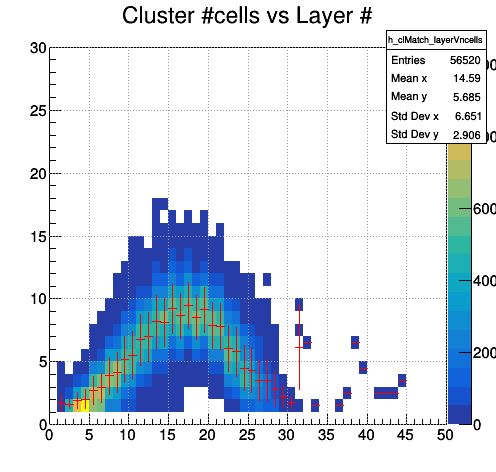

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


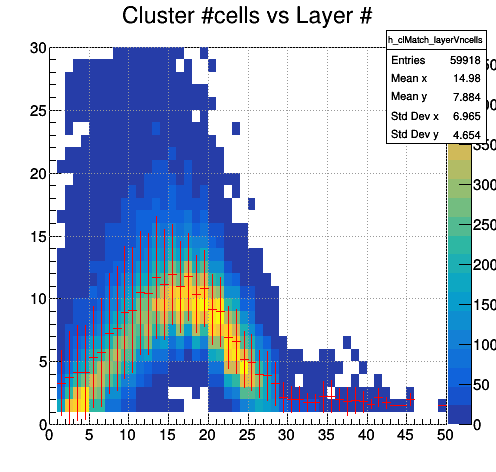

In [48]:
hclMatch_pt35_layerVncells = [histo.h_layerVncells for histo in hclMatch_pt35_histos]
drawSeveral(hclMatch_pt35_layerVncells, labels_pt35,'COLZ',do_profile=True)


The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


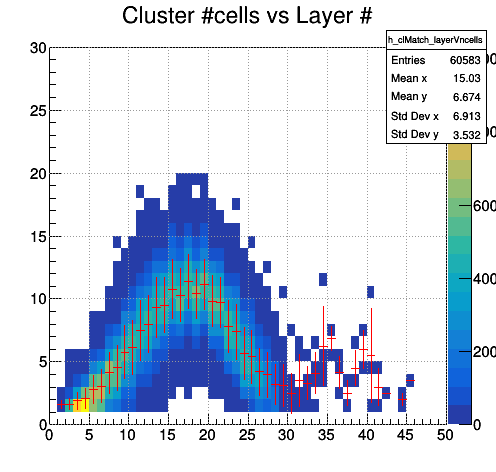

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


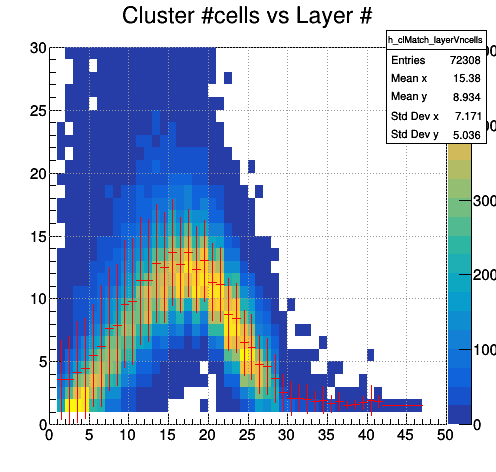

In [49]:
hclMatch_pt50_layerVncells = [histo.h_layerVncells for histo in hclMatch_pt50_histos]
drawSeveral(hclMatch_pt50_layerVncells, labels_pt50,'COLZ',do_profile=True)


The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


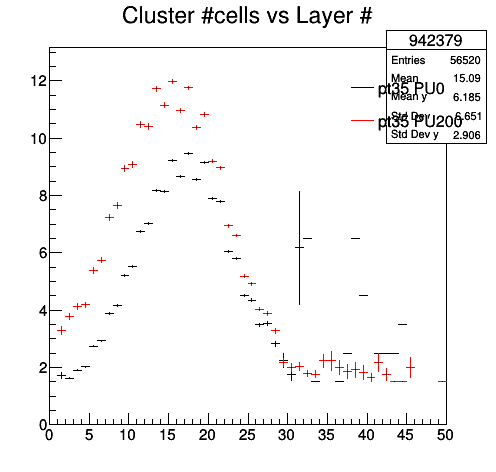

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


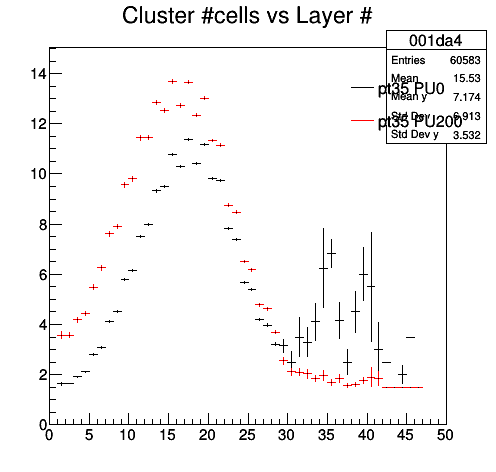

In [50]:
hclMatch_pt35_profLayerVncells = [histo.h_layerVncells.ProfileX(uuid.uuid4().hex[:6]) for histo in hclMatch_pt35_histos]
drawSame(hclMatch_pt35_profLayerVncells, labels_pt35)

hclMatch_pt50_profLayerVncells = [histo.h_layerVncells.ProfileX(uuid.uuid4().hex[:6]) for histo in hclMatch_pt50_histos]
drawSame(hclMatch_pt50_profLayerVncells, labels_pt35)

### GEO clusters

In [51]:
hclMatchGEO_pt35_ncells = [hist.h_ncells for hist in hclMatchGEO_pt35_histos]
drawSame(hclMatchGEO_pt35_ncells, labels_pt35, norm=True)

hclMatchGEO_pt50_ncells = [hist.h_ncells for hist in hclMatchGEO_pt50_histos]
drawSame(hclMatchGEO_pt50_ncells, labels_pt50, norm=True)

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


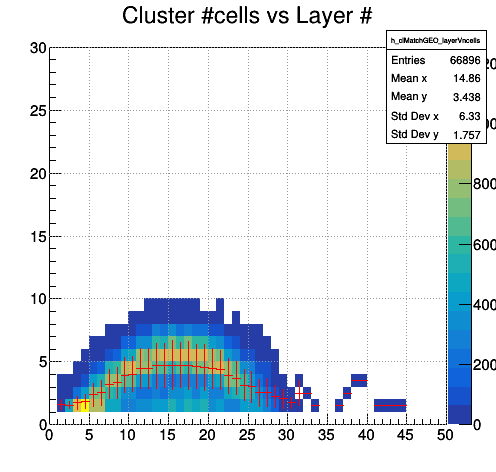

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


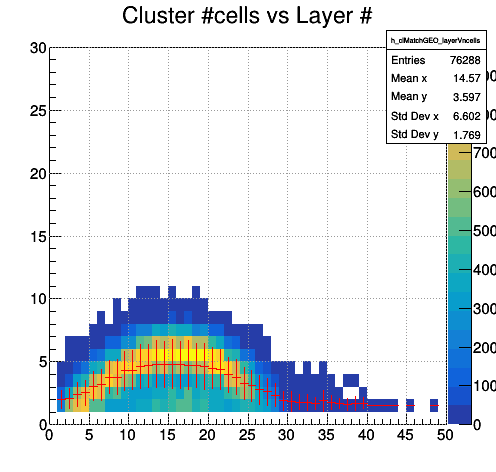

In [52]:
hclMatchGEO_pt35_layerVncells = [histo.h_layerVncells for histo in hclMatchGEO_pt35_histos]
drawSeveral(hclMatchGEO_pt35_layerVncells, labels_pt35,'COLZ',do_profile=True)


The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


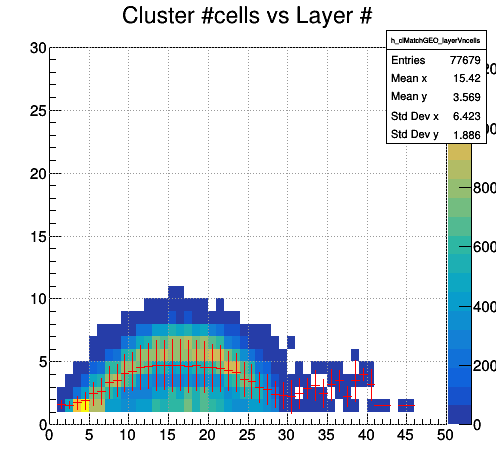

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


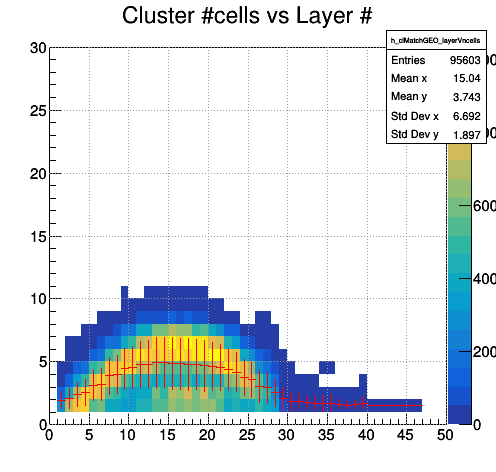

In [53]:
hclMatchGEO_pt50_layerVncells = [histo.h_layerVncells for histo in hclMatchGEO_pt50_histos]
drawSeveral(hclMatchGEO_pt50_layerVncells, labels_pt50,'COLZ',do_profile=True)


In [54]:
hclMatchGEO_profLayerVncells = [histo.h_layerVncells.ProfileX(uuid.uuid4().hex[:6]) for histo in hclMatchGEO_histos]
drawSame(hclMatchGEO_profLayerVncells, elePu_labels)

NameError: name 'hclMatchGEO_histos' is not defined

### DBS Clusters

In [55]:
hclMatchDBS_pt35_ncells = [hist.h_ncells for hist in hclMatchDBS_pt35_histos]
drawSame(hclMatchDBS_pt35_ncells, labels_pt35, norm=True)

hclMatchDBS_pt50_ncells = [hist.h_ncells for hist in hclMatchDBS_pt50_histos]
drawSame(hclMatchDBS_pt50_ncells, labels_pt50, norm=True)

In [56]:
hclMatchDBSp_pt35_ncells = [hist.h_ncells for hist in hclMatchDBSp_pt35_histos]
drawSame(hclMatchDBSp_pt35_ncells, labels_pt35, norm=True)

hclMatchDBSp_pt50_ncells = [hist.h_ncells for hist in hclMatchDBSp_pt50_histos]
drawSame(hclMatchDBSp_pt50_ncells, labels_pt50, norm=True)

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


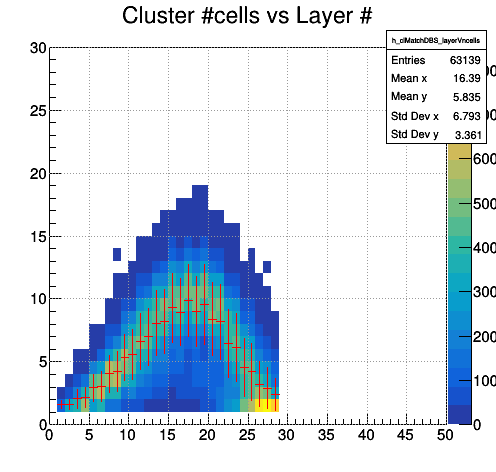

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


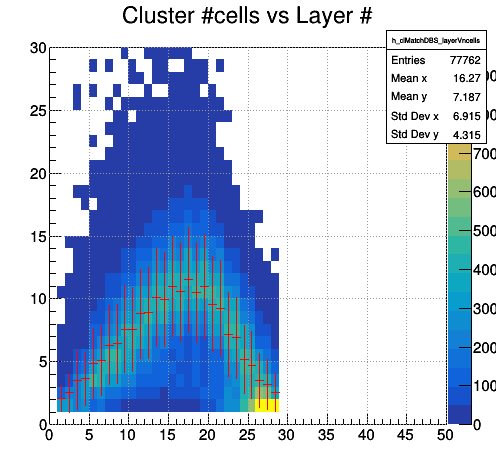

In [57]:

hclMatchDBS_pt50_layerVncells = [histo.h_layerVncells for histo in hclMatchDBS_pt50_histos]
drawSeveral(hclMatchDBS_pt50_layerVncells, labels_pt50,'COLZ',do_profile=True)


In [ ]:
hclMatchDBS_profLayerVncells = [histo.h_layerVncells.ProfileX(uuid.uuid4().hex[:6]) for histo in hclMatchDBS_histos]
drawSame(hclMatchDBS_profLayerVncells, elePu_labels)

### Compare the layer by layer projections

In [ ]:
def projectLayers(plot2D):
    return [plot2D.ProjectionY(uuid.uuid4().hex[:6], layer, layer) for layer in range(2,29)]


hclMatch_PU0_layerVncellsProj = projectLayers(hclMatch_layerVncells[0])
hclMatch_PU50_layerVncellsProj = projectLayers(hclMatch_layerVncells[1])
hclMatch_PU100_layerVncellsProj = projectLayers(hclMatch_layerVncells[2])
hclMatch_PU200_layerVncellsProj = projectLayers(hclMatch_layerVncells[3])

hclMatchGEO_PU0_layerVncellsProj = projectLayers(hclMatchGEO_layerVncells[0])
hclMatchGEO_PU50_layerVncellsProj = projectLayers(hclMatchGEO_layerVncells[1])
hclMatchGEO_PU100_layerVncellsProj = projectLayers(hclMatchGEO_layerVncells[2])
hclMatchGEO_PU200_layerVncellsProj = projectLayers(hclMatchGEO_layerVncells[3])


hclMatchDBS_PU0_layerVncellsProj = projectLayers(hclMatchDBS_layerVncells[0])
hclMatchDBS_PU50_layerVncellsProj = projectLayers(hclMatchDBS_layerVncells[1])
hclMatchDBS_PU100_layerVncellsProj = projectLayers(hclMatchDBS_layerVncells[2])
hclMatchDBS_PU200_layerVncellsProj = projectLayers(hclMatchDBS_layerVncells[3])



In [ ]:
ly = 1
drawSame([hclMatch_PU0_layerVncellsProj[ly], hclMatch_PU50_layerVncellsProj[ly], hclMatch_PU100_layerVncellsProj[ly], hclMatch_PU200_layerVncellsProj[ly]], elePu_labels)
drawSame([hclMatchGEO_PU0_layerVncellsProj[ly], hclMatchGEO_PU50_layerVncellsProj[ly], hclMatchGEO_PU100_layerVncellsProj[ly], hclMatchGEO_PU200_layerVncellsProj[ly]], elePu_labels)
drawSame([hclMatchDBS_PU0_layerVncellsProj[ly], hclMatchDBS_PU50_layerVncellsProj[ly], hclMatchDBS_PU100_layerVncellsProj[ly], hclMatchDBS_PU200_layerVncellsProj[ly]], elePu_labels)






In [ ]:
drawSame([hclMatch_PU200_layerVncellsProj[ly], hclMatchGEO_PU200_layerVncellsProj[ly], hclMatchDBS_PU200_layerVncellsProj[ly]], ['NN PU200', 'GEO PU200', 'DBS PU200'])


In [ ]:
ly = 10
drawSame([hclMatch_PU0_layerVncellsProj[ly], hclMatch_PU50_layerVncellsProj[ly], hclMatch_PU100_layerVncellsProj[ly], hclMatch_PU200_layerVncellsProj[ly]], elePu_labels)
drawSame([hclMatchGEO_PU0_layerVncellsProj[ly], hclMatchGEO_PU50_layerVncellsProj[ly], hclMatchGEO_PU100_layerVncellsProj[ly], hclMatchGEO_PU200_layerVncellsProj[ly]], elePu_labels)
drawSame([hclMatchDBS_PU0_layerVncellsProj[ly], hclMatchDBS_PU50_layerVncellsProj[ly], hclMatchDBS_PU100_layerVncellsProj[ly], hclMatchDBS_PU200_layerVncellsProj[ly]], elePu_labels)



In [ ]:
drawSame([hclMatch_PU200_layerVncellsProj[ly], hclMatchGEO_PU200_layerVncellsProj[ly], hclMatchDBS_PU200_layerVncellsProj[ly]], ['NN PU200', 'GEO PU200', 'DBS PU200'])


In [ ]:
drawSame([hclMatch_PU200_layerVncellsProj[ly], hclMatchDBS_PU200_layerVncellsProj[ly]], ['NN PU200', 'DBS PU200'])


In [ ]:
ly = 15
drawSame([hclMatch_PU0_layerVncellsProj[ly], hclMatch_PU50_layerVncellsProj[ly], hclMatch_PU100_layerVncellsProj[ly], hclMatch_PU200_layerVncellsProj[ly]], elePu_labels)
drawSame([hclMatchDBS_PU0_layerVncellsProj[ly], hclMatchDBS_PU50_layerVncellsProj[ly], hclMatchDBS_PU100_layerVncellsProj[ly], hclMatchDBS_PU200_layerVncellsProj[ly]], elePu_labels)


In [ ]:
drawSame([hclMatch_PU200_layerVncellsProj[ly], hclMatchDBS_PU200_layerVncellsProj[ly]], ['NN PU200', 'DBS PU200'])


In [ ]:
ly = 20
drawSame([hclMatch_PU0_layerVncellsProj[ly], hclMatch_PU50_layerVncellsProj[ly], hclMatch_PU100_layerVncellsProj[ly], hclMatch_PU200_layerVncellsProj[ly]], elePu_labels)
drawSame([hclMatchDBS_PU0_layerVncellsProj[ly], hclMatchDBS_PU50_layerVncellsProj[ly], hclMatchDBS_PU100_layerVncellsProj[ly], hclMatchDBS_PU200_layerVncellsProj[ly]], elePu_labels)


In [ ]:
drawSame([hclMatch_PU200_layerVncellsProj[ly], hclMatchDBS_PU200_layerVncellsProj[ly]], ['NN PU200', 'DBS PU200'])


We now compare NN and DBS clusters at the same PU

In [ ]:
drawSame([hclMatch_profLayerVncells[0], hclMatchDBS_profLayerVncells[0]], ['PU0 NN', 'PU0 DBS'])

In [ ]:
drawSame([hclMatch_profLayerVncells[1], hclMatchDBS_profLayerVncells[1]], ['PU50 NN', 'PU50 DBS'])

In [ ]:
drawSame([hclMatch_profLayerVncells[2], hclMatchDBS_profLayerVncells[2]], ['PU100 NN', 'PU100 DBS'])

In [ ]:
drawSame([hclMatch_profLayerVncells[3], hclMatchDBS_profLayerVncells[3]], ['PU200 NN', 'PU200 DBS'])

In [ ]:

hclMatchDBS_layerVnCoreCells = [histo.h_layerVnCoreCells for histo in hclMatchDBS_histos]
drawSeveral(hclMatchDBS_layerVnCoreCells, elePu_labels,'COLZ',do_profile=True)


In [ ]:
hclMatchDBS_profLayerVnCoreCells = [histo.h_layerVnCoreCells.ProfileX(uuid.uuid4().hex[:6]) for histo in hclMatchDBS_histos]
drawSame(hclMatchDBS_profLayerVnCoreCells, elePu_labels)

In [ ]:
drawSame([hclMatch_profLayerVncells[0], hclMatchDBS_profLayerVnCoreCells[0]], ['PU0 NN', 'PU0 DBS CORE'])

In [ ]:
drawSame([hclMatch_profLayerVncells[3], hclMatchDBS_profLayerVnCoreCells[3]], ['PU200 NN', 'PU200 DBS CORE'])

## Cluster Energy
### NN Clusters

In [ ]:
hclMatch_layerVenergy = [histo.h_layerVenergy for histo in hclMatch_histos]
drawSeveral(hclMatch_layerVenergy, elePu_labels,'COLZ',do_profile=True)

In [ ]:
hclMatch_profLayerVenergy = [histo.h_layerVenergy.ProfileX(uuid.uuid4().hex[:6]) for histo in hclMatch_histos]
drawSame(hclMatch_profLayerVenergy, elePu_labels)

Average energy per cell in each layer

In [ ]:
#PU 0 ele 50GeV
drawProfileRatio(hclMatch_profLayerVenergy[0], hclMatch_profLayerVncells[0], ymin=None, ymax=None)


In [ ]:
#PU 200 ele 50GeV
drawProfileRatio(hclMatch_profLayerVenergy[3], hclMatch_profLayerVncells[3], ymin=None, ymax=None)


### DBS clusters

In [ ]:
hclMatchDBS_layerVenergy = [histo.h_layerVenergy for histo in hclMatchDBS_histos]
drawSeveral(hclMatchDBS_layerVenergy, elePu_labels,'COLZ',do_profile=True)

In [ ]:
hclMatchDBS_profLayerVenergy = [histo.h_layerVenergy.ProfileX(uuid.uuid4().hex[:6]) for histo in hclMatchDBS_histos]
drawSame(hclMatchDBS_profLayerVenergy, elePu_labels)

In [ ]:
#PU 200 ele 50GeV
drawProfileRatio(hclMatchDBS_profLayerVenergy[3], hclMatchDBS_profLayerVncells[3], ymin=None, ymax=None)


We compare DBS and NN cluters for PU 200

In [ ]:
drawSame([hclMatch_profLayerVenergy[3], hclMatchDBS_profLayerVenergy[3]], ['PU200 NN', 'PU200 DBSCAN'])

In [ ]:
drawSame([hclMatch_profLayerVenergy[0], hclMatchDBS_profLayerVenergy[0]], ['PU0 NN', 'PU0 DBSCAN'])

## Number of 2D clusters in the matched 3D cluster
### NN clusters

In [58]:
hcl3DMatch_pt35_nclu = [hist.h_nclu for hist in hcl3DMatch_pt35_histos]
drawSame(hcl3DMatch_pt35_nclu, labels_pt35)

hcl3DMatch_pt50_nclu = [hist.h_nclu for hist in hcl3DMatch_pt50_histos]
drawSame(hcl3DMatch_pt50_nclu, labels_pt50)

In [59]:
hcl3DMatchGEO_pt35_nclu = [hist.h_nclu for hist in hcl3DMatchGEO_pt35_histos]
drawSame(hcl3DMatchGEO_pt35_nclu, labels_pt35)

hcl3DMatchGEO_pt50_nclu = [hist.h_nclu for hist in hcl3DMatchGEO_pt50_histos]
drawSame(hcl3DMatchGEO_pt50_nclu, labels_pt50)

### DBS clusters

In [60]:
hcl3DMatchDBS_pt35_nclu = [hist.h_nclu for hist in hcl3DMatchDBS_pt35_histos]
drawSame(hcl3DMatchDBS_pt35_nclu, labels_pt35)

hcl3DMatchDBS_pt50_nclu = [hist.h_nclu for hist in hcl3DMatchDBS_pt50_histos]
drawSame(hcl3DMatchDBS_pt50_nclu, labels_pt50)

We compare NN and DBS distributions

In [61]:
drawSame([hcl3DMatch_nclu[0], hcl3DMatchDBS_nclu[0]], ['PU0 NN', 'PU0 DBSCAN'])

NameError: name 'hcl3DMatch_nclu' is not defined

In [62]:
drawSame([hcl3DMatch_nclu[1], hcl3DMatchDBS_nclu[1]], ['PU50 NN', 'PU50 DBSCAN'])

NameError: name 'hcl3DMatch_nclu' is not defined

In [63]:
drawSame([hcl3DMatch_nclu[2], hcl3DMatchDBS_nclu[2]], ['PU100 NN', 'PU100 DBSCAN'])

NameError: name 'hcl3DMatch_nclu' is not defined

In [64]:
drawSame([hcl3DMatch_nclu[3], hcl3DMatchDBS_nclu[3]], ['PU200 NN', 'PU200 DBSCAN'])
# how come that there are 3D NN clusters with < 3 associated clusters?? isn't there a cut at 3?

NameError: name 'hcl3DMatch_nclu' is not defined

## 3D cluster energy
### NN clusters

In [65]:
hcl3DMatch_energy = [hist.h_energy for hist in hcl3DMatch_histos]
drawSame(hcl3DMatch_energy, elePu_labels)

NameError: name 'hcl3DMatch_histos' is not defined

### DBS clusters

In [66]:
hcl3DMatchDBS_energy = [hist.h_energy for hist in hcl3DMatchDBS_histos]
drawSame(hcl3DMatchDBS_energy, elePu_labels)

NameError: name 'hcl3DMatchDBS_histos' is not defined

## Energy of matched TCs
### NN clusters

In [67]:
htcMatch_energy = [hist.h_energy for hist in htcMatch_histos]
drawSame(htcMatch_energy, elePu_labels, options='hist')

htcMatch_energy_norm = [hist.h_energy.Clone() for hist in htcMatch_histos]
drawSame(htcMatch_energy_norm, elePu_labels,norm=True, options='hist')


NameError: name 'htcMatch_histos' is not defined

### DBS clusters

In [ ]:
htcMatchDBS_energy = [hist.h_energy for hist in htcMatchDBS_histos]
drawSame(htcMatchDBS_energy, elePu_labels, options='hist')

htcMatchDBS_energy_norm = [hist.h_energy.Clone() for hist in htcMatchDBS_histos]
drawSame(htcMatchDBS_energy_norm, elePu_labels,norm=True, options='hist')


In [ ]:
# let's compare E distribution with and without signal
tc_energies_comp = [htcMatch_energy_norm[3], htc_energies_scaled[3]]
drawSame(tc_energies_comp, ['w 50GeV signal PU200', 'nu-gun PU200'])

In [ ]:
hclMatch_energy = [hist.h_energy for hist in hclMatch_histos]
drawSame(hclMatch_energy, elePu_labels, options='hist')

hclMatch_energy_norm = [hist.h_energy.Clone() for hist in hclMatch_histos]
drawSame(hclMatch_energy_norm, elePu_labels,norm=True, options='hist')






In [ ]:
cl2d_energy_comp = [hclMatch_energy_norm[3], hclAll_energies_scaled[3]]
drawSame(cl2d_energy_comp, ['w 50GeV signal PU200', 'nu-gun PU200'])

In [ ]:
htcMatch_layer = [hist.h_layer for hist in htcMatch_histos]
drawSame(htcMatch_layer, elePu_labels, options='hist')


In [ ]:
htcMatchDBS_layer = [hist.h_layer for hist in htcMatchDBS_histos]
drawSame(htcMatchDBS_layer, elePu_labels, options='hist')


In [ ]:
htcMatch_energyVlayer = [hist.h_layerVenergy for hist in htcMatch_histos]
drawSeveral(htcMatch_energyVlayer, elePu_labels, 'COLZ',do_profile=True)


In [ ]:
# the average energy per TC in a 3D cluster diminishes at higher PU since low PU TCs 
# are added indefinetely by the NN clustering

htcMatch_profEnergyVlayer = [hist.ProfileX(uuid.uuid4().hex[:6]) for hist in htcMatch_energyVlayer]
drawSame(htcMatch_profEnergyVlayer, elePu_labels)

## Pt resolution

In [68]:
helereso_pt35_ptRes = [hist.h_ptRes for hist in helereso_pt35_histos]
drawSame(helereso_pt35_ptRes, labels_pt35, norm=True)

helereso_pt50_ptRes = [hist.h_ptRes for hist in helereso_pt50_histos]
drawSame(helereso_pt50_ptRes, labels_pt50, norm=True)

In [69]:
heleresoGEO_pt35_ptRes = [hist.h_ptRes for hist in heleresoGEO_pt35_histos]
drawSame(heleresoGEO_pt35_ptRes, labels_pt35, norm=True)

heleresoGEO_pt50_ptRes = [hist.h_ptRes for hist in heleresoGEO_pt50_histos]
drawSame(heleresoGEO_pt50_ptRes, labels_pt50, norm=True)

In [70]:
heleresoDBS_pt35_ptRes = [hist.h_ptRes for hist in heleresoDBS_pt35_histos]
drawSame(heleresoDBS_pt35_ptRes, labels_pt35, norm=True)

heleresoDBS_pt50_ptRes = [hist.h_ptRes for hist in heleresoDBS_pt50_histos]
drawSame(heleresoDBS_pt50_ptRes, labels_pt50, norm=True)

In [71]:
heleresoDBSp_pt35_ptRes = [hist.h_ptRes for hist in heleresoDBSp_pt35_histos]
drawSame(heleresoDBSp_pt35_ptRes, labels_pt35, norm=True)

heleresoDBSp_pt50_ptRes = [hist.h_ptRes for hist in heleresoDBSp_pt50_histos]
drawSame(heleresoDBSp_pt50_ptRes, labels_pt50, norm=True)

In [89]:
drawSame([helereso_pt35_ptRes[0], heleresoGEO_pt35_ptRes[0], heleresoDBS_pt35_ptRes[0], heleresoDBSp_pt35_ptRes[0]], 
         ['NN PU0', 'GEO PU0', 'DBS PU0', 'DBSp PU0'],
         options='hist')
drawSame([helereso_pt50_ptRes[0], heleresoGEO_pt50_ptRes[0], heleresoDBS_pt50_ptRes[0]], 
         ['NN PU0', 'GEO PU0', 'DBS PU0'],
         options='hist')

In [91]:
drawSame([helereso_pt35_ptRes[1], heleresoGEO_pt35_ptRes[1], heleresoDBS_pt35_ptRes[1]], 
         ['NN PU200', 'GEO PU200', 'DBS PU200'],
         options='hist')
drawSame([helereso_pt50_ptRes[1], heleresoGEO_pt50_ptRes[1], heleresoDBS_pt50_ptRes[1]], 
         ['NN PU200', 'GEO PU200', 'DBS PU200'],
         options='hist')

## Energy resolution
### NN clusters

In [81]:
helereso_pt35_energyRes = [hist.h_energyRes for hist in helereso_pt35_histos]
drawSame(helereso_pt35_energyRes, labels_pt35,options='hist', norm=True)

helereso_pt50_energyRes = [hist.h_energyRes for hist in helereso_pt50_histos]
drawSame(helereso_pt50_energyRes, labels_pt50,options='hist', norm=True)

### GEO clusters

In [83]:
heleresoGEO_pt35_energyRes = [hist.h_energyRes for hist in heleresoGEO_pt35_histos]
drawSame(heleresoGEO_pt35_energyRes, labels_pt35,options='hist', norm=True)

heleresoGEO_pt50_energyRes = [hist.h_energyRes for hist in heleresoGEO_pt50_histos]
drawSame(heleresoGEO_pt50_energyRes, labels_pt50,options='hist', norm=True)

### DBS cluster

In [84]:
heleresoDBS_pt35_energyRes = [hist.h_energyRes for hist in heleresoDBS_pt35_histos]
drawSame(heleresoDBS_pt35_energyRes, labels_pt35,options='hist', norm=True)

heleresoDBS_pt50_energyRes = [hist.h_energyRes for hist in heleresoDBS_pt50_histos]
drawSame(heleresoDBS_pt50_energyRes, labels_pt50,options='hist', norm=True)

In [85]:
heleresoDBS_pt35_coreEnergyRes = [hist.h_coreEnergyRes for hist in heleresoDBS_pt35_histos]
drawSame(heleresoDBS_pt35_coreEnergyRes, labels_pt35,options='hist', norm=True)

heleresoDBS_pt50_coreEnergyRes = [hist.h_coreEnergyRes for hist in heleresoDBS_pt50_histos]
drawSame(heleresoDBS_pt50_coreEnergyRes, labels_pt50,options='hist', norm=True)

In [86]:
heleresoDBSp_pt35_energyRes = [hist.h_energyRes for hist in heleresoDBSp_pt35_histos]
drawSame(heleresoDBSp_pt35_energyRes, labels_pt35,options='hist', norm=True)

heleresoDBSp_pt50_energyRes = [hist.h_energyRes for hist in heleresoDBSp_pt50_histos]
drawSame(heleresoDBSp_pt50_energyRes, labels_pt50,options='hist', norm=True)

In [87]:
drawSame([helereso_pt35_energyRes[0], heleresoGEO_pt35_energyRes[0], heleresoDBS_pt35_energyRes[0], heleresoDBS_pt35_coreEnergyRes[0], heleresoDBSp_pt35_energyRes[0]], 
         ['NN PU0', 'GEO PU0', 'DBS PU0', 'DBS core PU0', 'DBSp'],
         options='hist')
drawSame([helereso_pt50_energyRes[0], heleresoGEO_pt50_energyRes[0], heleresoDBS_pt50_energyRes[0], heleresoDBS_pt50_coreEnergyRes[0], heleresoDBSp_pt50_energyRes[0]], 
         ['NN PU0', 'GEO PU0', 'DBS PU0', 'DBS core PU0', 'DBSp'],
         options='hist')

In [88]:
drawSame([helereso_pt35_energyRes[1], heleresoGEO_pt35_energyRes[1], heleresoDBS_pt35_energyRes[1], heleresoDBS_pt35_coreEnergyRes[1], heleresoDBSp_pt35_energyRes[1]], 
         ['NN PU0', 'GEO PU0', 'DBS PU0', 'DBS core PU0', 'DBSp'],
         options='hist',
         norm=True)
drawSame([helereso_pt50_energyRes[1], heleresoGEO_pt50_energyRes[1], heleresoDBS_pt50_energyRes[1], heleresoDBS_pt50_coreEnergyRes[1]], 
         ['NN PU0', 'GEO PU0', 'DBS PU0', 'DBS core PU0'],
         options='hist',
         norm=True)

## Resolution using layers 10 to 20 only

In [ ]:
helereso_centralEnergyRes = [hist.h_centralEnergyRes for hist in helereso_histos]
drawSame(helereso_centralEnergyRes, elePu_labels, options='hist')

In [ ]:
heleresoDBS_centralEnergyRes = [hist.h_centralEnergyRes for hist in heleresoDBS_histos]
drawSame(heleresoDBS_centralEnergyRes, elePu_labels,options='hist')

In [ ]:
drawSame([helereso_centralEnergyRes[3], heleresoDBS_centralEnergyRes[3]], ['NN PU200', 'DBS PU200'])

In [ ]:
heleresoDBS_coreEnergyRes = [hist.h_coreEnergyRes for hist in heleresoDBS_histos]
drawSame(heleresoDBS_coreEnergyRes, elePu_labels,options='hist')

In [ ]:

helereso_energyRes_scaled = [hist.Clone() for hist in helereso_energyRes]
heleresoGEO_energyRes_scaled = [hist.Clone() for hist in heleresoGEO_energyRes]

heleresoDBS_energyRes_scaled = [hist.Clone() for hist in heleresoDBS_energyRes]
heleresoDBS_coreEnergyRes_scaled = [hist.Clone() for hist in heleresoDBS_coreEnergyRes]


In [ ]:
# we compare resolutions @ PU 0
puIdx = 0
drawSame([helereso_energyRes[puIdx], heleresoGEO_energyRes[puIdx], heleresoDBS_energyRes[puIdx]], ['PU0 NN clusters', 'PU0 GEO', 'PU0 DBSCAN clusters'], options='hist', norm=False)
drawSame([helereso_energyRes_scaled[puIdx], heleresoGEO_energyRes_scaled[puIdx], heleresoDBS_energyRes_scaled[puIdx]], ['PU0 NN clusters', 'PU0 GEO', 'PU0 DBSCAN clusters'], options='hist', norm=True)
drawSame([helereso_energyRes_scaled[puIdx], heleresoGEO_energyRes_scaled[puIdx], heleresoDBS_coreEnergyRes_scaled[puIdx]], ['PU0 NN clusters', 'PU0 GEO', 'PU0 DBSCAN CORE clusters'], options='hist', norm=True)


In [ ]:
# we compare resolutions @ PU 50
puIdx = 1
drawSame([helereso_energyRes[puIdx], heleresoGEO_energyRes[puIdx], heleresoDBS_energyRes[puIdx]], ['PU50 NN clusters', 'PU50 GEO', 'PU50 DBSCAN clusters'], options='hist', norm=False)
drawSame([helereso_energyRes_scaled[puIdx], heleresoGEO_energyRes_scaled[puIdx], heleresoDBS_energyRes_scaled[puIdx]], ['PU50 NN clusters', 'PU50 GEO', 'PU50 DBSCAN clusters'], options='hist', norm=True)
drawSame([helereso_energyRes_scaled[puIdx], heleresoGEO_energyRes_scaled[puIdx], heleresoDBS_coreEnergyRes_scaled[puIdx]], ['PU50 NN clusters', 'PU50 GEO', 'PU50 DBSCAN CORE clusters'], options='hist', norm=True)


In [ ]:
# we compare resolutions @ PU 100
puIdx = 2
drawSame([helereso_energyRes[puIdx], heleresoGEO_energyRes[puIdx], heleresoDBS_energyRes[puIdx]], ['PU100 NN clusters', 'PU0 GEO', 'PU0 DBSCAN clusters'], options='hist', norm=False)
drawSame([helereso_energyRes_scaled[puIdx], heleresoGEO_energyRes_scaled[puIdx], heleresoDBS_energyRes_scaled[puIdx]], ['PU100 NN clusters', 'PU0 GEO', 'PU0 DBSCAN clusters'], options='hist', norm=True)
drawSame([helereso_energyRes_scaled[puIdx], heleresoGEO_energyRes_scaled[puIdx], heleresoDBS_coreEnergyRes_scaled[puIdx]], ['PU100 NN clusters', 'PU0 GEO', 'PU0 DBSCAN CORE clusters'], options='hist', norm=True)


In [ ]:
# we compare resolutions @ PU 200
puIdx = 3
drawSame([helereso_energyRes[puIdx], heleresoGEO_energyRes[puIdx], heleresoDBS_energyRes[puIdx]], ['PU200 NN clusters', 'PU0 GEO', 'PU0 DBSCAN clusters'], options='hist', norm=False)
drawSame([helereso_energyRes_scaled[puIdx], heleresoGEO_energyRes_scaled[puIdx], heleresoDBS_energyRes_scaled[puIdx]], ['PU200 NN clusters', 'PU0 GEO', 'PU0 DBSCAN clusters'], options='hist', norm=True)
drawSame([helereso_energyRes_scaled[puIdx], heleresoGEO_energyRes_scaled[puIdx], heleresoDBS_coreEnergyRes_scaled[puIdx]], ['PU200 NN clusters', 'PU0 GEO', 'PU0 DBSCAN CORE clusters'], options='hist', norm=True)
drawSame([helereso_energyRes_scaled[3], heleresoGEO_energyRes_scaled[puIdx], heleresoDBS_energyRes_scaled[3], heleresoDBS_coreEnergyRes_scaled[3]], ['PU200 NN', 'PU200 GEO', 'PU200 DBSCAN', 'PU200 DBSCAN Core'], options='hist', norm=False)



In [ ]:
helereso_energyResVnclu = [hist.h_energyResVnclu for hist in helereso_histos]
drawSeveral(helereso_energyResVnclu, elePu_labels, 'COLZ',do_profile=True)


In [ ]:
helereso_energyResVnclu_1 = [hist.h_energyResVnclu.ProjectionY(uuid.uuid4().hex[:6], 19, 26).Rebin(2) for hist in helereso_histos]
drawSame(helereso_energyResVnclu_1, elePu_labels, options='hist')



In [ ]:
helereso_energyResVnclu_2 = [hist.h_energyResVnclu.ProjectionY(uuid.uuid4().hex[:6], 1, 18).Rebin(2) for hist in helereso_histos]
drawSame(helereso_energyResVnclu_2, elePu_labels, options='hist')


In [ ]:
heleresoGEO_energyResVnclu = [hist.h_energyResVnclu for hist in heleresoGEO_histos]
drawSeveral(heleresoGEO_energyResVnclu, elePu_labels, 'COLZ',do_profile=True)


In [ ]:
heleresoGEO_energyResVnclu_1 = [hist.h_energyResVnclu.ProjectionY(uuid.uuid4().hex[:6], 19, 26).Rebin(2) for hist in heleresoGEO_histos]
drawSame(heleresoGEO_energyResVnclu_1, elePu_labels, options='hist')


In [ ]:
heleresoGEO_energyResVnclu_2 = [hist.h_energyResVnclu.ProjectionY(uuid.uuid4().hex[:6], 1, 18).Rebin(2) for hist in heleresoGEO_histos]
drawSame(heleresoGEO_energyResVnclu_2, elePu_labels, options='hist')


In [ ]:
heleresoDBS_energyResVnclu = [hist.h_energyResVnclu for hist in heleresoDBS_histos]
drawSeveral(heleresoDBS_energyResVnclu, elePu_labels, 'COLZ',do_profile=True)


In [ ]:
heleresoDBS_energyResVnclu_1 = [hist.h_energyResVnclu.ProjectionY(uuid.uuid4().hex[:6], 19, 26).Rebin(2) for hist in heleresoDBS_histos]
drawSame(heleresoDBS_energyResVnclu_1, elePu_labels, options='hist')


In [ ]:
heleresoDBS_energyResVnclu_2 = [hist.h_energyResVnclu.ProjectionY(uuid.uuid4().hex[:6], 1, 18).Rebin(2) for hist in heleresoDBS_histos]
drawSame(heleresoDBS_energyResVnclu_2, elePu_labels, options='hist')


In [ ]:
heleresoDBS_coreEnergyResVnclu = [hist.h_coreEnergyResVnclu for hist in heleresoDBS_histos]
drawSeveral(heleresoDBS_coreEnergyResVnclu, elePu_labels, 'COLZ',do_profile=True)


In [ ]:
heleresoDBS_coreEnergyResVnclu_1 = [hist.h_coreEnergyResVnclu.ProjectionY(uuid.uuid4().hex[:6], 19, 26).Rebin(2) for hist in heleresoDBS_histos]
drawSame(heleresoDBS_coreEnergyResVnclu_1, elePu_labels, options='hist')


In [ ]:
heleresoDBS_coreEnergyResVnclu_2 = [hist.h_coreEnergyResVnclu.ProjectionY(uuid.uuid4().hex[:6], 1, 18).Rebin(2) for hist in heleresoDBS_histos]
drawSame(heleresoDBS_coreEnergyResVnclu_2, elePu_labels, options='hist')


In [ ]:
drawSame([helereso_energyResVnclu_1[3], heleresoGEO_energyResVnclu_1[3], heleresoDBS_energyResVnclu_1[3], heleresoDBS_coreEnergyResVnclu_1[3]], ['NN PU200', 'GEO PU 200', 'DBS PU 200', 'DBS Core PU200'], options='hist',norm=True)

In [ ]:
drawSame([helereso_energyResVnclu_2[3], heleresoDBS_energyResVnclu_2[3], heleresoDBS_coreEnergyResVnclu_2[3]], ['NN PU200', 'DBS PU 200', 'DBS Core PU200'], options='hist',norm=True)

In [ ]:
helereso_energyResVeta = [hist.h_energyResVeta for hist in helereso_histos]
drawSeveral(helereso_energyResVeta, elePu_labels, 'COLZ',do_profile=True)


In [ ]:
heleresoGEO_energyResVeta = [hist.h_energyResVeta for hist in heleresoGEO_histos]
drawSeveral(heleresoGEO_energyResVeta, elePu_labels, 'COLZ',do_profile=True)


In [ ]:
heleresoDBS_energyResVeta = [hist.h_energyResVeta for hist in heleresoDBS_histos]
drawSeveral(heleresoDBS_energyResVeta, elePu_labels, 'COLZ',do_profile=True)


In [ ]:
helereso_energyResCentral = [hist.h_energyResVeta.ProjectionY(uuid.uuid4().hex[:6], 15, 86) for hist in helereso_histos]
heleresoDBS_energyResCentral = [hist.h_energyResVeta.ProjectionY(uuid.uuid4().hex[:6], 15, 86) for hist in heleresoDBS_histos]

In [ ]:
drawSame(helereso_energyResCentral, elePu_labels,options='hist')

In [ ]:
drawSame(heleresoDBS_energyResCentral, elePu_labels,options='hist')

In [ ]:
drawSame([helereso_energyResCentral[0], heleresoDBS_energyResCentral[0]], ['PU0 NN clusters', 'PU0 DBSCAN clusters'], options='hist', norm=False)


In [ ]:
drawSame([helereso_energyResCentral[3], heleresoDBS_energyResCentral[3]], ['PU200 NN clusters', 'PU200 DBSCAN clusters'], options='hist', norm=False)


In [ ]:
helereso_profEnergyResVeta = [hist.ProfileX(uuid.uuid4().hex[:6]) for hist in helereso_energyResVeta]
heleresoDBS_profEnergyResVeta = [hist.ProfileX(uuid.uuid4().hex[:6]) for hist in heleresoDBS_energyResVeta]


In [ ]:
drawSame([helereso_profEnergyResVeta[0], heleresoDBS_profEnergyResVeta[0]],['NN PU0', 'DBS PU0'])

In [ ]:
drawSame([helereso_profEnergyResVeta[1], heleresoDBS_profEnergyResVeta[1]],['NN PU50', 'DBS PU50'])

In [ ]:
drawSame([helereso_profEnergyResVeta[2], heleresoDBS_profEnergyResVeta[2]],['NN PU100', 'DBS PU100'])

In [ ]:
drawSame([helereso_profEnergyResVeta[3], heleresoDBS_profEnergyResVeta[3]],['NN PU200', 'DBS PU200'])

In [ ]:
hreso2D_etaRes = [hist.h_etaRes for hist in hreso2D_histos]
drawSame(hreso2D_etaRes, elePu_labels,options='hist', logy=True)

In [ ]:
hreso2DDBS_etaRes = [hist.h_etaRes for hist in hreso2DDBS_histos]
drawSame(hreso2DDBS_etaRes, elePu_labels,options='hist', logy=True)

In [ ]:
hreso2D_phiMRes = [hist.h_phiMRes for hist in hreso2D_histos]
drawSame(hreso2D_phiMRes, elePu_labels,options='hist', logy=True)

In [ ]:
hreso2DDBS_phiMRes = [hist.h_phiMRes for hist in hreso2DDBS_histos]
drawSame(hreso2DDBS_phiMRes, elePu_labels,options='hist', logy=True)

In [ ]:
drawSame([hreso2D_phiMRes[3], hreso2DDBS_phiMRes[3]],['PU200 NN', 'PU200 DBS'], logy=True)